**Group 43**<br>
s250202<br>
s250221<br>
s250273<br>

Section 0 includes the code so the plots can be displayed in Section 5.

# **0. Viz Code**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from IPython.display import display

df = pd.read_csv('merged_collisions_weather_2012-2024.csv')

# Convert into datetime format
df['CRASH DATE'] = pd.to_datetime(df['CRASH DATE'])
df['CRASH TIME'] = pd.to_datetime(df['CRASH TIME'])

# Convert BOROUGH values from uppercase to title case
df['BOROUGH'] = df['BOROUGH'].str.title()

# Erase 2025
df = df[df['CRASH DATE'].dt.year != 2025]

df_new = df.copy()

df_new['Year'] = df_new['CRASH DATE'].dt.year
borough_year = df_new.groupby('Year').size()
borough_year

# Plot
fig = plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=borough_year.index,
    y=borough_year.values,
    color='navy',
    alpha=.8,
    width=0.6,              
)

# axis labels / title
plt.title('Traffic Accidents by Year', fontsize=20, fontweight='normal',pad=15)
plt.xlabel('Year', fontsize=16, labelpad=15)
plt.ylabel('')

# ticks & grid
plt.xticks(rotation=0,  fontsize=13)
plt.yticks([])
plt.grid(axis='y', linestyle='--', alpha=0.0)
sns.despine(left=True, bottom=False)

# add values above bars
for p in ax.patches:
    height = p.get_height()
    label  = f'{height/1_000:.0f}k' 
    ax.text(
        p.get_x() + p.get_width() / 2,     
        height + 0.01 * borough_year.max(),
        label,
        ha='center', va='bottom',
        fontsize=12,
        color='black'
    )

# plt.tight_layout()
# plt.show()
plt.close(fig)
figure1 = fig
# _ = 0

In [2]:
# Create a new dataframe with deaths per year by type
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, FactorRange, Legend, LegendItem, ColorBar, LinearColorMapper
from bokeh.layouts import column, row
from bokeh.palettes import Category10, Blues9
from bokeh.io import output_notebook
from bokeh.transform import linear_cmap
from bokeh.models import FixedTicker

# We want the figure to show in the notebook
output_notebook()

# Prepare the data
df_deaths = df.copy()
df_deaths['Year'] = df_deaths['CRASH DATE'].dt.year

# Group by year and sum the deaths by type
deaths_by_year = df_deaths.groupby('Year').agg({
    'NUMBER OF PERSONS KILLED': 'sum',
    'NUMBER OF PEDESTRIANS KILLED': 'sum',
    'NUMBER OF CYCLIST KILLED': 'sum',
    'NUMBER OF MOTORIST KILLED': 'sum'
}).reset_index()

# Convert years to strings for categorical x-axis
deaths_by_year['Year'] = deaths_by_year['Year'].astype(str)

# Define death types and colors
death_types = [
    'NUMBER OF PERSONS KILLED',
    'NUMBER OF PEDESTRIANS KILLED', 
    'NUMBER OF CYCLIST KILLED', 
    'NUMBER OF MOTORIST KILLED'
]

# Create a ColumnDataSource
source = ColumnDataSource(deaths_by_year)

# Create figure with categorical x-range
p = figure(
    x_range=deaths_by_year['Year'].tolist(),
    height=500, 
    width=800,
    title="Fatalities per Year (2012-2024)",
    toolbar_location="above",
    tools="pan,wheel_zoom,box_zoom,reset,save",
    min_border=0,  # Remove margins
    margin=0  # Remove margins
)

p.title.text_font = "Arial"  # Set font family
p.title.text_font_size = '15pt'  # Set font size
p.title.text_font_style = 'normal'

# Set global text properties for the figure
p.axis.axis_label_text_font = "Arial"
p.axis.major_label_text_font = "Arial"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.xaxis.major_label_text_font_size = "12pt"

# List to store legend items
legend_items = []

# Find the maximum death count across all types for consistent scaling
max_deaths = deaths_by_year[death_types].max().max()

# Create a color mapper for each death type with the same scale
mappers = {}
for death_type in death_types:
    mappers[death_type] = linear_cmap(
        field_name=death_type, 
        palette=list(reversed(Blues9)), 
        low=-50,
        high=max_deaths  # Use the same maximum for all types
    )

# Plot bars with different colors
for i, death_type in enumerate(death_types):
    # Create a more readable label
    label = death_type.replace('NUMBER OF ', '').replace(' KILLED', '')
    
    # Plot the bar with color mapping for all types
    bar = p.vbar(
        x='Year', 
        top=death_type, 
        source=source, 
        width=0.8, 
        color=mappers[death_type],
        muted_alpha=0.0,
        muted=(i!=0)
    )
    
    # Add to legend items
    legend_items.append(LegendItem(label=label, renderers=[bar]))

# Set axis labels with improved formatting
p.xaxis.axis_label = "Year"
# Remove the y-axis label
p.y_range.start = 0

# Improve axis appearance
p.xaxis.major_label_orientation = 0
# p.xaxis.major_label_text_font_size = "12pt"

# Hide the y-axis completely
p.yaxis.visible = False  # This hides the entire y-axis including ticks and labels

# Remove the y-grid lines
p.ygrid.grid_line_alpha = 0

# Create a separate legend
legend = Legend(items=legend_items, location="center", click_policy="mute")

# Add legend to the plot on the LEFT side
p.add_layout(legend, 'left')

# Add a single color bar for all death types
color_bar = ColorBar(
    color_mapper=LinearColorMapper(
        palette=list(reversed(Blues9)),
        low=0,
        high=max_deaths
    ),
    location=(0, 0),
    title="Number of Deaths",
    title_standoff=12,
    width=8,
    height=400,
    border_line_color=None,
    orientation='vertical',
    ticker=FixedTicker(ticks=[0, 50, 100, 150, 200, 250, 300]),  # Specify exact tick positions
    major_label_text_font_size="10pt"
)

# Add the color bar to the figure on the RIGHT side
p.add_layout(color_bar, 'right')

# Customize the plot appearance
# p.title.text_font_size = "16pt"
# p.xaxis.axis_label_text_font_size = "14pt"
p.xgrid.grid_line_color = None

# Remove all padding and margins
# p.min_border_left = 0
# p.min_border_right = 0
# p.min_border_top = 0
# p.min_border_bottom = 0
p.outline_line_color = None

# Show the plot
# show(p)
figure2 = p

Loading BokehJS ...

In [3]:
from urllib.request import urlopen
import json
import os
with urlopen('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Borough_Boundary/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson') as response:
    districts = json.load(response)
import plotly.express as px

# Aggregate the data by the district
df_new = df.copy()
a = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
a = a['BOROUGH'].value_counts()

# Proper form to plug into choropleth function
df_choroplex = a.reset_index()
df_choroplex.columns = ['BOROUGH', 'Count']

# Make sure the assets directory exists
# Put here the route!!!!!!!
# assets_dir = r"c:\Users\alvar\Desktop\02806_SDAV\Part2_SocialVisualization\aql14.github.io\assets\images"
# if not os.path.exists(assets_dir):
#     os.makedirs(assets_dir)

# Create the choropleth map
fig = px.choropleth(df_choroplex, 
                    geojson=districts, 
                    color="Count",
                    locations="BOROUGH", 
                    featureidkey="properties.BoroName",
                    range_color=(0, 120000),
                    projection="mercator",
                    color_continuous_scale="Blues",
                    labels={"Count": "Accidents"}
                   )

# Make the map bigger and clearer
fig.update_geos(fitbounds="locations", visible=False)

# Define a consistent font style
font_family = "Arial, sans-serif"
title_font_size = 20
label_font_size = 16
tick_font_size = 14

# Improve layout with larger text and figure size
fig.update_layout(
    # Increase figure size
    width=1000,
    height=800,
    
    # Add title with larger font
    title={
        'text': "Number of Traffic Accidents by NY Borough (2017-2018)",
        # 'font': {'size': 20, 'family': 'Arial, sans-serif', 'color': '#333333'},
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    
    # Improve margins
    margin={"r":20, "t":80, "l":20, "b":20},
    
    # Enhance colorbar appearance
    coloraxis_colorbar={
        'title': {'text': '', 'font': {'size': 18}},
        'tickfont': {'size': 16},
        'thickness': 20,
        'len': 0.6
    },
    
    # Improve overall font size
    font={'size': 16, 'family': 'Arial, sans-serif'}
)

figure3 = fig


In [4]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Select, CustomJS
from bokeh.layouts import column
from bokeh.transform import cumsum

df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)]
df_new['Hour'] = df_new['CRASH TIME'].dt.hour
# Group by District and Hour
hourly_counts = df_new.groupby(['BOROUGH', 'Hour']).size().reset_index(name='Count')

# Create a dictionary of data per district
districts = hourly_counts['BOROUGH'].unique()
district_data = {}
for district in districts:
    df_dist = hourly_counts[hourly_counts['BOROUGH'] == district]
    counts = np.zeros(24)
    counts[df_dist['Hour']] = df_dist['Count'].values
    angles = np.linspace(0, 2 * np.pi, 24, endpoint=False)
    district_data[district] = pd.DataFrame({
        'hour': list(range(24)),
        'angle': angles,
        'count': counts,
        'angle_degrees': np.degrees(angles),
        'color': ['#718dbf'] * 24
    })

from bokeh.plotting import figure, show, output_file
from bokeh.models import ColumnDataSource, Legend, LegendItem, ColorBar, LinearColorMapper
from bokeh.layouts import column, row
from bokeh.palettes import Category10, Blues9
from bokeh.transform import transform
from bokeh.io import output_notebook, curdoc

# Get unique districts
districts = sorted(df_new['BOROUGH'].unique())

# Create a color palette for districts
colors = Category10[len(districts)] if len(districts) <= 10 else Category10[10]

# Create the figure
p = figure(
    width=800, height=600,
    title="Accidents by Hour of Day (2017)",
    toolbar_location=None, tools="",
    x_axis_type=None, y_axis_type=None,
    min_border=0, outline_line_color=None,
    background_fill_color="#ffffff"
)

p.title.text_font = "Arial"  # Set font family
p.title.text_font_size = '15pt'  # Set font size
p.title.text_font_style = 'normal'

# Set global text properties for the figure
p.axis.axis_label_text_font = "Arial"
p.axis.major_label_text_font = "Arial"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"

# Find the maximum count across all districts for consistent scaling
max_count = 0
for district in districts:
    district_data = df_new[df_new['BOROUGH'] == district]
    if not district_data.empty:
        district_max = district_data['Hour'].value_counts().max()
        if district_max > max_count:
            max_count = district_max

# Create color mapper for consistent coloring
color_mapper = LinearColorMapper(palette=list(reversed(Blues9)), low=0, high=max_count)

# List to store legend items
legend_items = []

# Plot each district as a separate wedge series
for i, district in enumerate(districts):
    district_data = df_new[df_new['BOROUGH'] == district]
    
    # Count crimes by hour
    hourly_counts = district_data['Hour'].value_counts().sort_index()
    
    # Create a complete range of hours (0-23)
    full_hours = pd.Series(0, index=range(24))
    hourly_counts = hourly_counts.add(full_hours, fill_value=0)
    
    # Convert to radians for polar coordinates
    theta = [(hour + 0.5) * 2 * np.pi / 24 for hour in hourly_counts.index]
    width = 2*np.pi/24 * 0.9  # Bar width with spacing
    
    # Calculate start and end angles explicitly
    start_angles = [t - width/2 for t in theta]
    end_angles = [t + width/2 for t in theta]
    
    # Create data source
    source = ColumnDataSource(data=dict(
        hour=hourly_counts.index,
        count=hourly_counts.values,
        theta=theta,
        start_angle=start_angles,
        end_angle=end_angles
    ))
    
    # Add the wedges (bars) for this district
    wedges = p.wedge(
        x=0, y=0, radius="count",
        start_angle="start_angle",
        end_angle="end_angle",
        source=source,
        fill_color=transform('count', color_mapper),
        line_color=None,
        alpha=1,
        muted_alpha=0.0,  # When muted, make it invisible
        # muted=True       # Start not muted
        muted=(i != 3),    # Only the first district is not muted initially
    )
    
    # Add to legend
    legend_items.append(LegendItem(label=district, renderers=[wedges]))

# Add hour labels at cardinal points
for hour, angle in [(0, 0), (6, np.pi/2), (12, np.pi), (18, 3*np.pi/2)]:
    label_angle = angle
    x = 1.1 * max_count * np.sin(label_angle)
    y = 1.1 * max_count * np.cos(label_angle)
    p.text(x, y, text=[f"{hour:02d}"], text_align="center", text_baseline="middle", text_font_size="14pt")

# # Add radial lines for each hour
# for hour in range(24):
#     angle = hour * 2 * np.pi / 24
#     x0, y0 = 0, 0
#     x1 = max_count * 1.05 * np.sin(angle)
#     y1 = max_count * 1.05 * np.cos(angle)
#     p.line([x0, x1], [y0, y1], color="gray", alpha=0.3, line_width=0.5)

# Add color bar
color_bar = ColorBar(
    color_mapper=color_mapper,
    title="Number of Accidents",
    location=(0, 0),
    orientation="vertical",
    title_standoff=12
)
p.add_layout(color_bar, 'right')

# Create a legend with click policy
legend = Legend(
    items=legend_items,
    location="center",
    click_policy="mute",  # This enables the interactive toggling
    label_text_font="Arial",
    label_text_font_size="10pt"
)

# Add the legend to the left of the plot
p.add_layout(legend, 'left')

# For Jupyter notebook
output_notebook()
figure4 = p
# show(p)

# # For standalone HTML (TO SAVE THE HTML)!!!!!!
# output_file("c:/Users/alvar/Desktop/02806_SDAV/Part2_SocialVisualization/aql14.github.io/assets/images/accidents_by_hour.html", title="Accidents by Hour of Day (2017)")
# save(p)

Loading BokehJS ...

In [5]:
# Create a copy of the dataframe for temperature analysis
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)]
df_temp = df_new.copy()

# Extract month from CRASH DATE
df_temp['Month'] = df_temp['CRASH DATE'].dt.month

# Group by month and calculate average temperature and std
monthly_stats = df_temp.groupby('Month')['temperature_2m (°C)'].agg(['mean', 'std']).reset_index()

# Create a more readable month name column
import calendar
monthly_stats['Month_Name'] = monthly_stats['Month'].apply(lambda x: calendar.month_abbr[x])

# Sort by month number to ensure chronological order
monthly_stats = monthly_stats.sort_values('Month')

figure5 = plt.figure(figsize=(10, 6))

# Plot the standard deviation region
plt.fill_between(monthly_stats['Month_Name'], 
                 monthly_stats['mean'] - monthly_stats['std'],
                 monthly_stats['mean'] + monthly_stats['std'],
                 alpha=0.2, color='darkblue', label='±1 std')

# Plot the mean line
plt.plot(monthly_stats['Month_Name'], monthly_stats['mean'], 
         marker='o', linestyle='-', linewidth=2, color='darkblue', alpha=0.8)

# Add labels and title
plt.xlabel('Month', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.title('Average Temperature by Month (2017)', fontsize=16, pad=20)

# Customize the plot
plt.grid(axis='y', linestyle='--', alpha=0.0)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
# plt.yticks([])

# Disable spines
ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# Add data points values
for i, row in monthly_stats.iterrows():
    plt.annotate(f'{row["mean"]:.1f}°C', 
                 (row['Month_Name'], row['mean']),
                 textcoords="offset points", 
                 xytext=(0,10), 
                 ha='right',
                 fontsize=10.5)

plt.tight_layout()
plt.close()


In [6]:
# Create a copy of the dataframe for precipitation analysis
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)]
# df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
df_prec = df_new.copy()

# Extract date components
df_prec['Date'] = df_prec['CRASH DATE'].dt.date  # Extract just the date part without time
df_prec['Month'] = df_prec['CRASH DATE'].dt.month

# First, get unique precipitation values per day
# Group by date and take the first precipitation value (since all accidents on same day have same value)
daily_prec = df_prec.groupby('Date')['precipitation (mm)'].first().reset_index()
daily_rain = df_prec.groupby('Date')['rain (mm)'].first().reset_index()

# Now group these unique daily values by month and sum
monthly_prec = daily_prec.groupby(daily_prec['Date'].apply(lambda x: x.month))['precipitation (mm)'].sum().reset_index()
monthly_prec.rename(columns={'Date': 'Month'}, inplace=True)

monthly_rain = daily_rain.groupby(daily_rain['Date'].apply(lambda x: x.month))['rain (mm)'].sum().reset_index()
monthly_rain.rename(columns={'Date': 'Month'}, inplace=True)

# Create a more readable month name column
import calendar
monthly_prec['Month_Name'] = monthly_prec['Month'].apply(lambda x: calendar.month_abbr[x])
monthly_rain['Month_Name'] = monthly_rain['Month'].apply(lambda x: calendar.month_abbr[x])

# Sort by month number to ensure chronological order
monthly_prec = monthly_prec.sort_values('Month')
monthly_rain = monthly_rain.sort_values('Month')

# Calculate snow as the difference between precipitation and rain
# First, merge the dataframes on Month
monthly_data = pd.merge(monthly_prec, monthly_rain, on=['Month', 'Month_Name'], suffixes=('_prec', '_rain'))
# Then calculate snow
monthly_data['snow (mm)'] = monthly_data['precipitation (mm)'] - monthly_data['rain (mm)']
# Replace negative values with 0 (in case of measurement errors)
monthly_data['snow (mm)'] = monthly_data['snow (mm)'].clip(lower=0)


figure6 = plt.figure(figsize=(9, 5))

# Plot all three curves on the same figure
plt.plot(monthly_data['Month_Name'], monthly_data['precipitation (mm)'], 
         marker='o', linestyle='-', linewidth=2, color='darkblue', alpha=0.8, label='Precipitation')
plt.plot(monthly_data['Month_Name'], monthly_data['rain (mm)'], 
         marker='o', linestyle='dotted', linewidth=2, color='cornflowerblue', alpha=1, label='Rain')
plt.plot(monthly_data['Month_Name'], monthly_data['snow (mm)'], 
         marker='o', linestyle='dotted', linewidth=2, color='gray', alpha=0.8, label='Snow')

# Add labels and title
plt.xlabel('Month', fontsize=12)
plt.ylabel('Millimeters (mm)', fontsize=12)  # Add y-axis label
plt.title('Precipitation, Rain and Snow by Month (mm)', fontsize=16, pad=20)
plt.grid(axis='y', linestyle='--', alpha=0.0)  # Make grid visible since we're showing y-axis

# Show y-ticks
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12) 

# Disable spines
ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)  # Make left spine visible for y-axis
ax.spines['bottom'].set_visible(True)

# Remove the annotation code blocks since we don't want text over the points
# (Removing the three annotation blocks that were here)

plt.legend()
plt.tight_layout()
plt.close()

In [7]:
import calendar

# Data
df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)].copy()
# df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)|(df['CRASH DATE'].dt.year == 2018)].copy()
df_2017['Month'] = df_2017['CRASH DATE'].dt.month
# df_2017['Date'] = df_2017['CRASH DATE'].dt.date

acc_pm   = df_2017.groupby('Month').size()
temp_pm  = df_2017.groupby('Month')['temperature_2m (°C)'].mean()
prec_pm  = df_2017.groupby('Month')['precipitation (mm)'].mean()
# prec_pm = prec_pm.groupby(prec_pm['Date'].apply(lambda x: x.month))['precipitation (mm)'].sum().reset_index()
# prec_pm.rename(columns={'Date': 'Month'}, inplace=True)
cloud_pm = df_2017.groupby('Month')['cloudcover (%)'].mean()
wind_pm  = df_2017.groupby('Month')['windspeed_10m (km/h)'].mean()

panels = [
    {"series": temp_pm,  "label": "Avg Temperature (°C)",  "title": "Temperature vs Accidents"},
    {"series": prec_pm,  "label": "Precipitation (mm)", "title": "Precipitation vs Accidents"},
    {"series": cloud_pm, "label": "Avg Cloud Cover (%)",   "title": "Cloud Cover vs Accidents"},
    {"series": wind_pm,  "label": "Avg Wind Speed (km/h)", "title": "Wind Speed vs Accidents"},
]

month_names = [calendar.month_abbr[m] for m in range(1, 13)]
acc_ymax = acc_pm.max() * 1.1

# Plot
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

bar_kw  = dict(color="steelblue", alpha=0.7)
line_kw = dict(color="darkblue", marker="o", linewidth=2, alpha=0.8)

for i, (ax, p) in enumerate(zip(axes, panels)):
    # left axis: weather bars
    ax.bar(month_names, p["series"].reindex(range(1, 13)).values, **bar_kw, label=p["label"])
    ax.set_ylabel(p["label"], fontsize=13, labelpad=10)
    ax.tick_params(axis="x", rotation=0, labelsize=12)
    ax.tick_params(axis="x", labelsize=12)
    ax.tick_params(axis="y", labelsize=12)

    # right axis: accident line
    twin = ax.twinx()
    twin.plot(month_names, acc_pm.reindex(range(1, 13)).values, **line_kw, label="Accidents")
    twin.set_ylabel("Number of Accidents", fontsize=13, labelpad=10)
    twin.set_ylim(0, acc_ymax)
    twin.tick_params(axis="y", labelsize=12)

    # hide and keep axes according to position
    # hide right-y on left column
    if i in (0, 2):
        twin.set_ylabel("")
        twin.set_yticklabels([])
        # twin.tick_params(axis="y", length=0)   # remove tick lines

    # hide x on top row
    if i in (0, 1):
        ax.set_xlabel("")
        ax.set_xticklabels([])
        # ax.tick_params(axis="x", length=0)

    # titles, spines, legend
    ax.set_title(p["title"],
             fontsize=14,
             fontweight="bold",
             pad=8)
    # for s in ["top"]:
    #     ax.spines[s].set_visible(False)
    #     twin.spines[s].set_visible(False)

    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = twin.get_legend_handles_labels()
    ax.legend(h1 + h2, l1 + l2, loc="upper right", fontsize=10)

fig.suptitle("Monthly Weather Variables vs Traffic Accidents (2017)", fontsize=16, y=0.95)
plt.tight_layout()
plt.subplots_adjust(top=0.88, wspace=0.15, hspace=0.15)
plt.close()

figure7 = fig



# **1. Motivation**

For our project, we chose to analyze two datasets:  
1. **Motor Vehicle Collisions in New York City (2012–2024)** from [NYC Open Data](https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95/about_data) 
2. **Historical Weather Data in New York City (2016–2022)**, found at [NY weather](https://www.kaggle.com/datasets/aadimator/nyc-weather-2016-to-2022)

We selected these datasets because we were intrigued by the potential relationship between weather conditions and traffic accidents. Our hypothesis is that specific weather patterns (heavy precipitation, reduced visibility due to cloud cover or strong winds) might be associated with an increased likelihood of vehicle collisions. Understanding this relationship could provide useful insights for urban safety planning and public awareness.

Our goal was to create a compelling and accessible data story that not only explores this potential relationship but also draws the viewer into the narrative. We aimed for a user experience that combines interactive visualizations, so users can explore and filter the data themselves, with static visuals that guide them through the main findings.

# **2. Basic Stats**

To better understand the dataset, we began with a thorough data cleaning and preprocessing phase for both the motor vehicle collisions dataset and the weather dataset.

#### Data Cleaning and Preprocessing

**Motor Vehicle Collisions Dataset**  
We first cleaned the vehicle collisions dataset by dropping features that were not relevant to our analysis, such as `'ZIP CODE'`, `'ON STREET NAME'`, and `'CROSS STREET NAME'`.  
Next, we assessed the dataset for missing values. Some missing values were found in the location fields, which included the coordinates of the accidents. Since location data was critical for our visualizations (especially choropleth maps) we dropped these rows, as it was impossible to infer the correct coordinates.

The `'BOROUGH'` column also had missing values. Because this attribute was also key for many of our visualizations, we chose to impute these missing values. Using the available coordinates for those accidents, we applied a K-Nearest Neighbors (KNN) classification algorithm to predict the missing boroughs. We validated the model using a hold-out cross-validation setup and achieved an accuracy of **99.73%** on the validation test set, indicating a very good fit.

Even though we ultimately did not include the `'CONTRIBUTING FACTOR VEHICLE'` feature in our main visualizations, we still preprocessed it. The original dataset contained many unique contributing factors. To make this feature more interpretable, we grouped them into broader categories. For instance, `'Unsafe Speed'`, `'Following Too Closely'`, and `'Traffic Control Disregarded'` were combined into a single category: `'Traffic Violations'`.

After cleaning and preprocessing, the following attributes were used from the vehicle collisions dataset:

- `CRASH DATE-TIME`
- `BOROUGH`
- `LOCATION`
- `NUMBER OF PERSONS INJURED`
- `NUMBER OF PERSONS KILLED`
- `NUMBER OF PEDESTRIANS INJURED`
- `NUMBER OF PEDESTRIANS KILLED`
- `NUMBER OF CYCLIST INJURED`
- `NUMBER OF CYCLIST KILLED`
- `NUMBER OF MOTORIST INJURED`
- `NUMBER OF MOTORIST KILLED`
- `CONTRIBUTING FACTOR VEHICLE`

**Weather Dataset**  
The weather dataset included hourly records of various weather conditions such as:
- `temperature_2m (°C)`
- `precipitation (mm)`
- `rain (mm)`
- `cloudcover (%)`
- `cloudcover_low (%)`
- `cloudcover_mid (%)`
- `cloudcover_high (%)`
- `windspeed_10m (km/h)`
- `winddirection_10m (°)`

Upon inspection, we saw that each observation represented the weather conditions for a specific hour. Since the collision dataset contained daily observations, we computed the daily average for each weather variable to make the two datasets compatible.

A notable limitation was that the weather dataset only spans 2016–2022, while the motor vehicle collisions dataset covers 2012–2024. Therefore, we limited the joint analysis of traffic accidents and weather to the years 2016–2022.

#### Exploratory Data Analysis

In our initial exploration of the collision data, which has 1922359 observations from 2012-2024, we identified the following key points:

- Accident frequency peaks during rush hours.
- Brooklyn and Queens consistently report the highest number of accidents.
- The majority of the accidents have and unspecified contributing factor. The specified most common contributing factors are Traffic Violations (420333) and Driver Attention Issues (417846).
- Seasonal patterns initially don't suggest more collisions occuring during winter months.

For the weather data, we observed:

- Precipitation levels spike during specific months (e.g., March, July, and September).
- Temperature and cloud cover show strong seasonal trends.
- Wind speed decreases drastically during summer season.

# **3. Data Analysis**

Our analysis aimed to uncover whether traffic accidents in New York City are primarily driven by human error or significantly influenced by weather conditions. Through a data story titled [*Is It Just Bad Driving – or is the Weather to Blame?*](https://emartinc.github.io/nyc-accidents-site/), we explored accident patterns from 2012 to 2024 and examined their potential connections with various weather variables.

We began by observing yearly accident trends. The data revealed a steady increase in accidents from 2012, reaching a peak in 2017, followed by a decline in subsequent years. The sharp drop in 2020 corresponds with the COVID-19 pandemic, which drastically changed urban mobility. Interestingly, despite fewer accidents during the pandemic years, fatalities did not decrease at the same rate. This disconnect suggests that road safety isn't solely about accident frequency—factors like crash severity, road conditions, or emergency response may also be at play.

A geographical breakdown highlighted that Brooklyn and Queens experienced the highest accident volumes in 2017–2018, likely due to their size, population density, and traffic load. Manhattan, despite its smaller area, also recorded a high number of incidents, which may be attributed to intense traffic and pedestrian activity. In contrast, Staten Island and the Bronx had significantly fewer crashes, pointing to the role of infrastructure and urban density in road safety.

We also examined the time-of-day patterns in accident frequency. Across all boroughs, collisions peaked between 12 PM and 6 PM, coinciding with heavy traffic and afternoon rush hours. Notable secondary spikes were observed around 6 AM and 9 PM, possibly linked to early commuters and evening activities. Overnight, accidents were far less frequent—but potentially more severe, as risky behaviors like drunk driving and fatigue may be more prevalent during those hours.

To evaluate the effect of weather, we focused on data from 2017 and 2018. Temperature trends followed expected seasonal patterns, but no strong correlation emerged between extreme temperatures and accident frequency. Surprisingly, accident rates were relatively low during the hottest months (July and August), while May and June—milder but busier months—had more incidents, suggesting human activity may be a stronger factor than temperature alone.

Rain and snow showed some alignment with accident counts early in the year, particularly in February through April. However, this correlation did not persist throughout the rest of the year. Wind speed and cloud cover, on the other hand, showed an inverse relationship with accidents: months with clearer skies and calmer wind conditions (like June and July) coincided with higher accident rates. This may indicate that perceived safer conditions lead to riskier driving behavior.

Ultimately, our analysis did not find a single weather variable that directly explains traffic accident trends. Instead, it revealed a complex interplay between environmental conditions and human behavior. While weather does influence driving conditions, its effects appear to be mediated by seasonal routines, driver perception, and traffic density. These insights can inform future urban planning, public safety campaigns, and traffic regulation strategies aimed at minimizing risk in both fair and adverse weather.

*The visualizations that support our findings is shown below in Section 5: Visualizations.*


# **4. Genre**

The storytelling genre used for this project is Magazine Style, characterized by a long-form, scroll-based layout that blends narrative text with supporting visuals. This genre is particularly effective for engaging readers in a linear, data-driven story, while maintaining a clean and immersive reading experience. 

In terms of visual narrative elements, the page opens with an establishing shot or splash screen, setting the tone with a strong title and subtitle to introduce the core question. The visual platform remains consistent throughout, using a stable layout that reinforces continuity and allows the reader to focus on the evolving narrative. This consistency is essential in magazine-style storytelling, where the emphasis is on guiding the reader through the content without distraction. 

Highlighting techniques such as close-ups, motion or feature distinction are not employed. The visualizations are static, which reflects the intent to prioritize clarity and readability over interactivity. This choice supports the magazine format’s focus on storytelling, supported by clear and interpretable visuals rather than complex interactions. 

There are no transitions or animated effects, as the story is meant to unfold through scrolling and text rather than dynamic visual sequences. In this context, the plots serve a crucial role, they allow reader to interpret the data not as raw numbers but as meaningful visual evidence that supports the written insights. In doing so, the visuals become part of the narrative rather than just decorative elements. They help transform abstract data into an understandable compelling story. 

Delving into the narrative structure of our webpage, we can clearly identify how it accurately aligns with the narrative model described by Segel and Heer in multiple dimensions. Under the ordering area, our site begins with a linear narrative: the user scrolls down through the storyline with visualizations all along the way. The structure that we’ve applied ensures that the user comprehends the problem stated before the interactive plots. Once the user arrives to this section of the webpage (with the interactive map and polar plot), the reader experience shifts towards a user-directed path, offering the autonomy to explore borough-specific patterns or time-based trends, albeit still within a guided scope.

From an interactive perspective, the webpage complies with several narrative techniques. It uses hover highlighting/details to allow users to inspect borough-specific accident data interactively. It avoids overwhelming complexity by limiting the interactivity, we do this intentionally to maintain the narrative structure clear. It also reflects stimulating default views, where the most informative visuals are shown by default to encourage meaningful exploration. Moving forward, on the messaging side, our project makes use of captions, headlines, and introductory text to anchor the viewer’s understanding, while offering a multi-layered approach through the accompanying descriptions. In this way, our project hits several engagement points while remaining accessible and narrative. 


# **5. Visualizations**

This first visualization illustrates the total number of traffic accidents reported annually in New York City from 2012 to 2024. A clear upward trend can be seen from 2012, peaking in both 2017 and 2018 with approximately 216,000 incidents each year. 

Following 2018, the number of accidents began to decline slightly, with a more dramatic drop in 2020, likely due to the COVID-19 pandemic, which led to reduced mobility and fewer vehicles on the road. Although the number of incidents has continued to decline steadily since then, the drop appears to have stabilized, suggesting that post-pandemic changes in commuting patterns may have had a lasting effect on traffic levels.

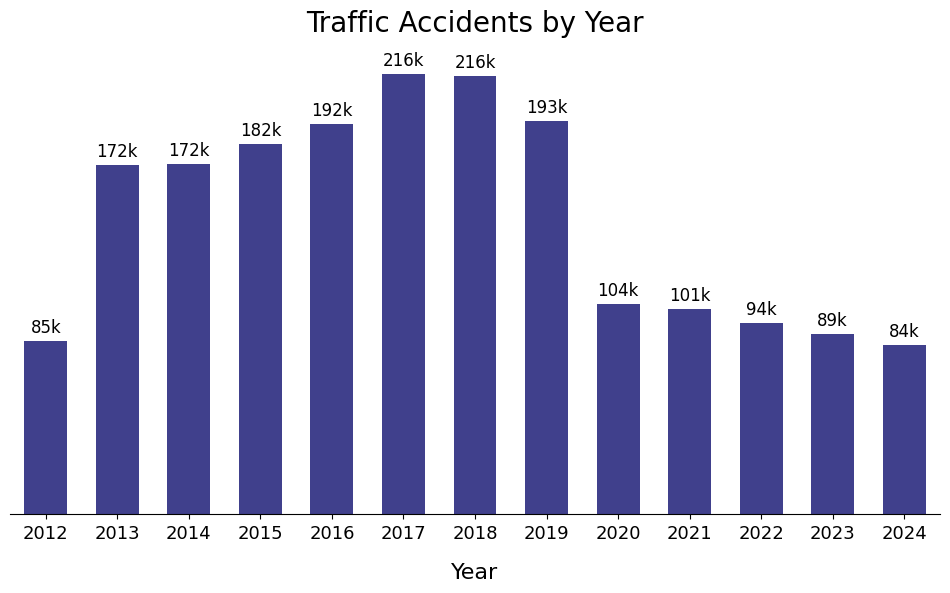

In [8]:
display(figure1)

Figure 2 focuses on traffic fatalities by year, 2017 stands out with a notably high number of deaths, reinforcing its relevance as a key year for analysis. Interestingly, there are also spikes in fatalities in 2013 and during the pandemic years, particularly between 2021 and 2023, despite the fact that the total number of accidents was significantly lower during that period. In 2024, fatalities drop slightly, but the decrease is minimal.

This mismatch between accident frequency and fatal outcomes suggests that fewer accidents don’t necessarily means safer roads. It raises important questions: Could it be due to the severity of crashes? Changes in driver behavior, or even factors like vehicle design, road infrastructure or emergency response times? While 2017 had the highest number of accidents and remains a data-rich year, the lack of direct correlation between accident volume and fatalities hint a deeper, more complex causes to explore.

In [9]:
show(figure2)

The third figure, which is an interactive map, presents a clear spatial distribution of traffic accidents across New York City’s boroughs between 2017 and 2018. Unsurprisingly, Brooklyn and Queens exhibit the darkest shades, indicating the highest number of traffic accidents, likely reflecting their larger populations, greater roadway networks, and high vehicle ownership. Despite its smaller size, Manhattan also shows a high accident count, possibly due to dense traffic volumes, tourism, and a high rate of pedestrian activity.

In contrast, Staten Island and the Bronx recorded significantly fewer accidents, with Staten Island having the lowest count, consistent with its lower population density and more suburban layout.This geographical trend underscores how urban density, transportation habits, and borough-specific infrastructure can influence traffic safety outcomes.

In [10]:
figure3.show()

Figure 4 reveals a consistent daily pattern of traffic accidents across all NYC boroughs. Accidents are most frequent between 12 PM and 6 PM, likely due to midday congestion and afternoon rush hour. There is a secondary spike at 9 PM, possibly related to evening outings or events. The lowest number of accidents occurs overnight, between 1 AM and 5 AM, though crashes during these hours may be more severe due to factors like alcohol use or driver fatigue.

A sharp increase is also observed at 6 AM, followed by a brief dip and another rise during the morning commute. Notably, these trends are consistent across all boroughs, indicating that the time of day has a stronger influence on accident frequency than location. This temporal pattern highlights the importance of targeting road safety measures to specific high-risk hours.

In [11]:
show(figure4)

Figure 5 shows the temperature data for New York City in 2017 and 2018, which reveals a clear seasonal cycle. The warmest months are June through September, with July and August reaching average highs of 25.1°C and 24.5°C, respectively. In contrast, the coldest period spans from December to March, with January averaging just 0.5°C. Transitional months such as April, May, October, and November feature moderate temperatures, reflecting the city's typical temperate climate pattern.

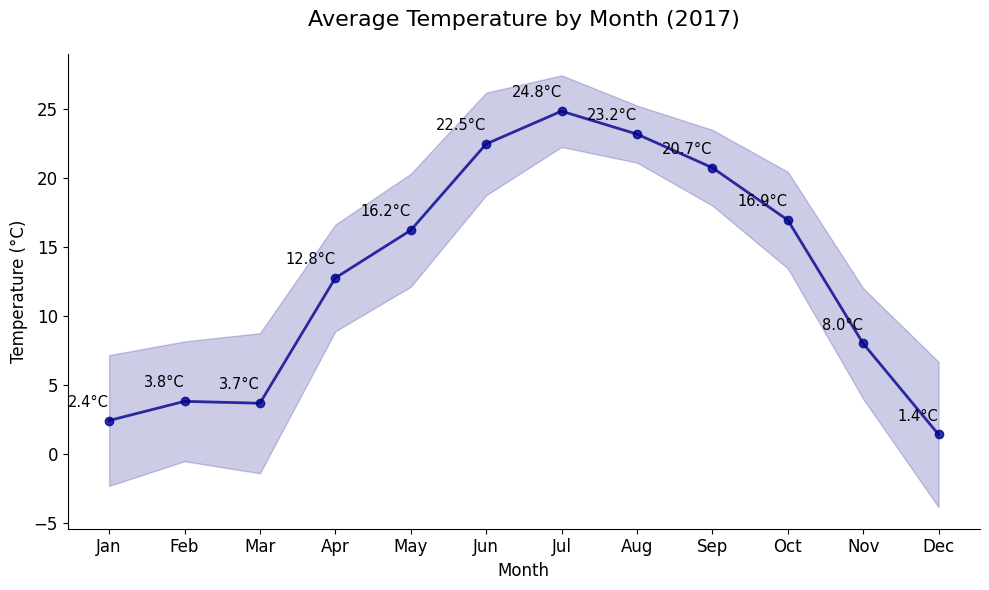

In [12]:
display(figure5)

Figure 6 aims to show New York City's distinct seasonal precipitation trends. Snowfall is most prominent in March, January, and February, defining the core of winter, with additional peaks in November and December signaling the start of colder conditions. Snowfall drops to zero during the summer and surrounding months. In terms of rainfall, July, August, and May are the wettest months, while June is notably one of the driest. These variations confirm that NYC experiences a full spectrum of weather conditions, making it a valuable case study for examining the impact of weather on traffic accidents.

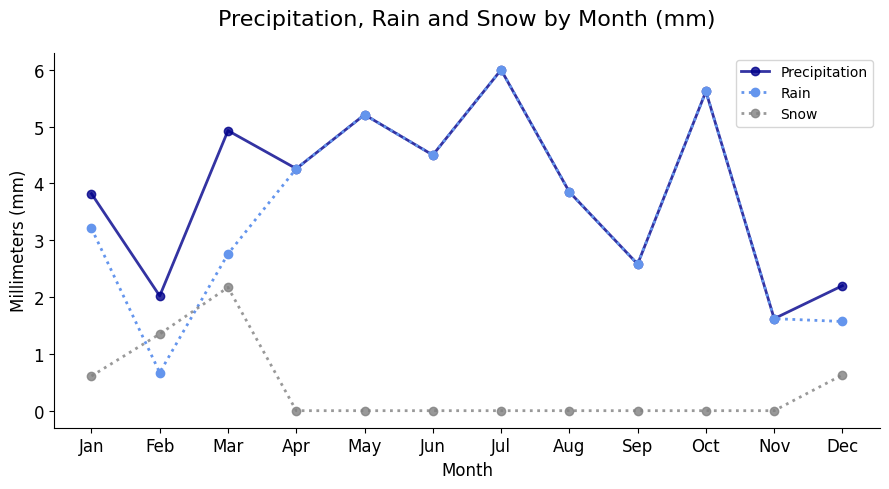

In [13]:
display(figure6)

This final Figure 7 compares multiple weather variables: temperature, precipitation, cloud cover, and wind speed—with traffic accident frequency in 2017. Contrary to common assumptions, the data reveals no strong or direct correlation between poor weather and accident rates.

Temperature does not appear to be a reliable predictor, as accident counts are lower in the hottest months (July and August) and higher in transitional months like May and June. Precipitation shows some alignment with accident peaks in early months (February–April), but this pattern fades during summer, when even dry months like July exhibit high accident levels.

A more consistent trend is seen with cloud cover: clearer months such as June and July tend to have more accidents, potentially due to increased driving activity or riskier behavior in perceived safe conditions. Wind speed also shows an inverse pattern, with fewer accidents during windier months like March and April, possibly because adverse conditions encourage more cautious driving.

Overall, the analysis suggests that weather alone does not explain accident trends. Instead, it is the interaction between environmental conditions and human behavior, like seasonal travel patterns, risk perception, and traffic volume.

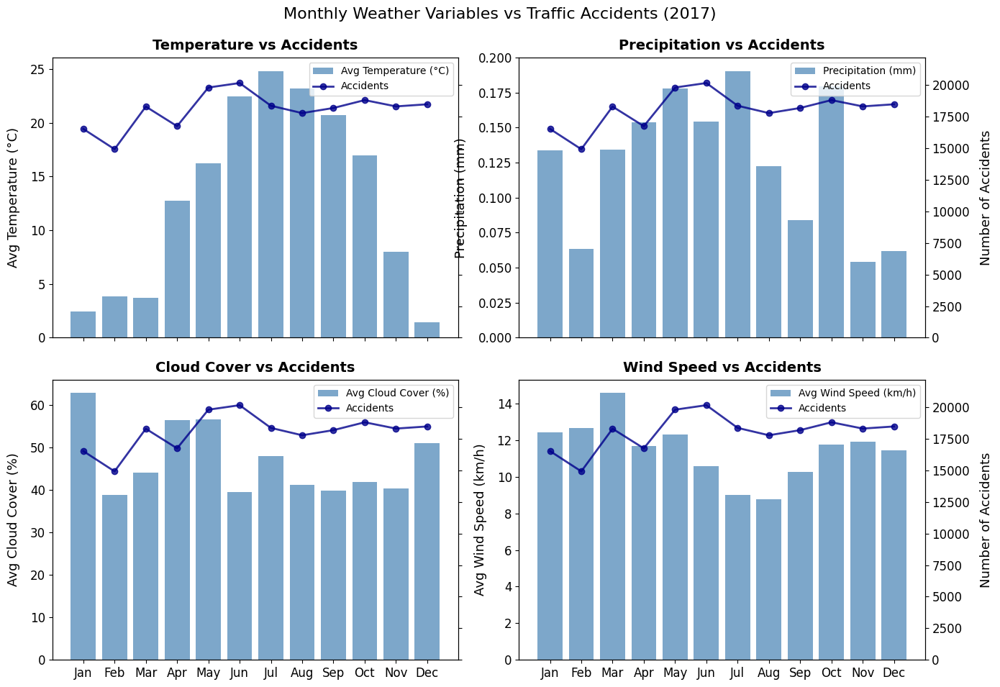

In [14]:
display(figure7)

# **6. Discussion**

This project set out to analyze traffic accidents in New York City, focusing on when and where they occur, and to explore whether weather conditions significantly influence accident frequency. We first examined the spatial and temporal distribution of collisions, identifying borough-level differences and daily patterns. Then, we combined this analysis with weather data to investigate the common belief that bad weather leads to more accidents.

While our exploration was relatively high-level and not deeply exhaustive, we found no strong or direct relationship between weather conditions and the number of traffic accidents. This suggests that other external factors, such as traffic density, city events, and neighborhood-specific dynamics, likely play a more significant role in accident occurrence than weather alone.

What worked well was the structure and clarity of the visual storytelling. The dataset enabled us to build intuitive and insightful visualizations, especially around trends by time of day and borough. Our integration of datasets and creation of an interactive narrative allowed for an accessible and informative user experience.

However, the project could benefit from greater analytical depth. One limitation was the relatively narrow temporal focus, we primarily analyzed data from 2017 due to the range of the weather dataset. Expanding the analysis across more years could improve the robustness of our findings and reveal longer-term patterns. 

Additionally, exploring more complex or subtle patterns, such as weekly trends or seasonal weekday vs. weekend variations, would have enriched the analysis. Another area for improvement is the inclusion of contributing factors to accidents (e.g., speeding, alcohol, or driver distraction). While we initially focused on weather, incorporating these human-related variables in future work could help clarify how different elements interact to influence road safety.

In summary, this project served as a solid foundation for understanding accident patterns in NYC and questioning weather’s real impact. With a broader dataset and more refined analysis, future work could uncover deeper insights into the causes and contexts of urban traffic accidents.

# **7. Contributions**

- **Story**: s250202 (20%), s250221(40%), s250273(40%)

- **Site design**: s250202 (25%), s250221(50%), s250273 (25%)

- **Data visualization**: s250202 (50%), s250221 (20%), s250273 (30%)

- **Notebook**: s250202 (35%), s250221 (30%), s250273 (35%)